# Portugese Bank Direct Marketing Campaign Data Analysis

**Overview**: Using a dataset related to marketing bank products over the telephone, classification models are created to determine what are the important factors that drives campaign effectiveness.  We found that the top 4 conditions for a successful campaign are number of employees, previous contact success, euribor 3 month rate and consumer confidence index.



### Data source

Dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  

Data is from call center of a Portuguese bank.  Marketers telephoned contacts for 17 campaigns that ran between May 2008 and November 2010.  Campaigns for long-term deposit with good interest rate had a 8% success rate, having 6,499 subscribed out of 79,354 contacted.



### Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

In [1]:
import pandas as pd
import numpy as np
import time
import sweetviz as sv
from ydata_profiling import ProfileReport 

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import PolynomialFeatures, OneHotEncoder, OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score

In [2]:
df = pd.read_csv('data/bank-additional-full.csv', sep = ';')

In [3]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


### Data Analysis

#### Bank Client Data
```
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
```
#### Last Contact of the Current Campaign
```
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
```
#### Campaign Attributes:
```
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
```
#### Social and Economic Context Attributes
```
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)
```
#### Target 
```
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



In [4]:
my_report = sv.analyze(df)
my_report.show_html()

                                             |                                                                …

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [5]:
profile = ProfileReport(df)
profile.to_file(output_file='output.html')

# generate the report
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/opt/anaconda3/lib/python3.11/site-packages/ydata_profiling/model/correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'telephone'')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Cleaning

* No missing value
* Remove duplicate rows
* Remove rows with 'unknown' values
* Drop irrelevant columns
* Transform data

In [6]:
# Remove duplicates
df.drop_duplicates()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [7]:
# Remove unknown rows
rows_with_unknown = df.apply(lambda row: any(row == 'unknown'), axis=1)

# Cleaned dataframe without rows containing 'unknown'
df = df[~rows_with_unknown]

df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


## Business Objective
Find the most effective model to determine what conditions will direct contact compaigns be successful. Based on client's profile, campaign attributes and history and economic context data, find the most influential factors to improve success rate for future campaigns.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30488 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             30488 non-null  int64  
 1   job             30488 non-null  object 
 2   marital         30488 non-null  object 
 3   education       30488 non-null  object 
 4   default         30488 non-null  object 
 5   housing         30488 non-null  object 
 6   loan            30488 non-null  object 
 7   contact         30488 non-null  object 
 8   month           30488 non-null  object 
 9   day_of_week     30488 non-null  object 
 10  duration        30488 non-null  int64  
 11  campaign        30488 non-null  int64  
 12  pdays           30488 non-null  int64  
 13  previous        30488 non-null  int64  
 14  poutcome        30488 non-null  object 
 15  emp.var.rate    30488 non-null  float64
 16  cons.price.idx  30488 non-null  float64
 17  cons.conf.idx   30488 non-null  floa

### Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features, prepare the features and target column for modeling with appropriate encoding and transformations.

### Drop irrevelant columns
* Duration - Not known until call is concluded.  Cannot use for predictive model.
* Default - 3 'yes' record out of 30k.  Not useful for predictive model
* Contact type, campaign - irrelevant for model
* pdays - Highly imbalanced data with 96.3% 999, with no previous contact.  Since 'previous' represents number of previous contacts already, this column can be dropped


In [9]:
# Drop irrelevant columns
df = df.drop(columns=['duration', 'default', 'contact', 'campaign', 'pdays'], axis=1)

In [10]:
# Encode categorical columns and transform
features = ['job', 'marital', 'education', 'housing', 'loan', 'month', 'day_of_week', 'poutcome', 'y']
ohe = OneHotEncoder(drop = 'if_binary')
encoded_features = ohe.fit_transform(df[features])

# Convert sparce matrix into dataFrame
encoded_df = pd.DataFrame(encoded_features.toarray(), columns=ohe.get_feature_names_out(features))


# Reset the indices of both DataFrames to concat them appropriately
df.reset_index(drop=True, inplace=True)
encoded_df.reset_index(drop=True, inplace=True)

# Concatenate to sales dataframe
df = pd.concat([df, encoded_df], axis=1)

# Drop encoded columns
df = df.drop(features, axis=1)
df


,age,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_admin.,job_blue-collar,job_entrepreneur,...,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,y_yes
0,56,0,1.1,93.994,-36.4,4.857,5191.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,37,0,1.1,93.994,-36.4,4.857,5191.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,40,0,1.1,93.994,-36.4,4.857,5191.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,56,0,1.1,93.994,-36.4,4.857,5191.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,59,0,1.1,93.994,-36.4,4.857,5191.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30483,73,0,-1.1,94.767,-50.8,1.028,4963.6,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
30484,46,0,-1.1,94.767,-50.8,1.028,4963.6,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
30485,56,0,-1.1,94.767,-50.8,1.028,4963.6,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
30486,44,0,-1.1,94.767,-50.8,1.028,4963.6,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


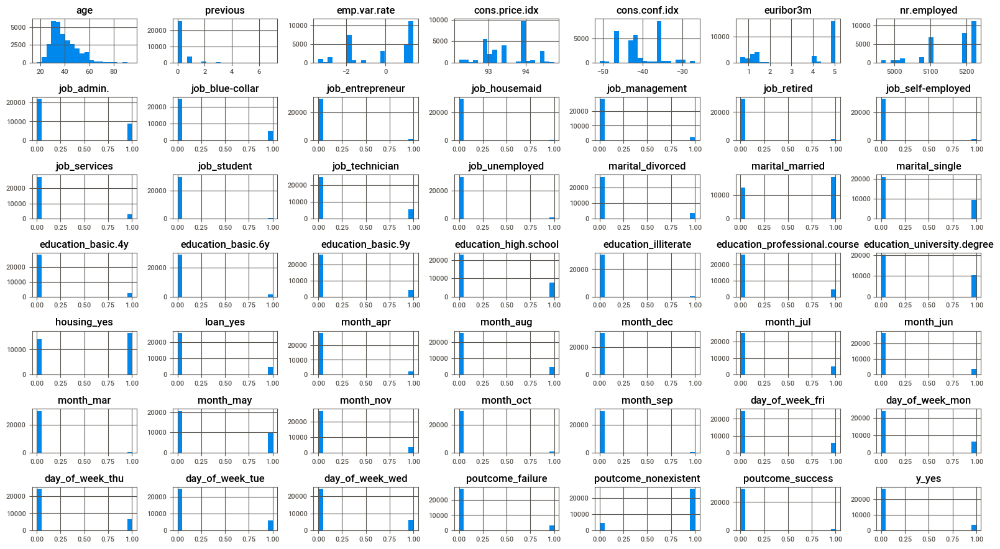

In [11]:
df.hist(figsize = (16,10), layout=(8, 7), bins=20)
plt.tight_layout()

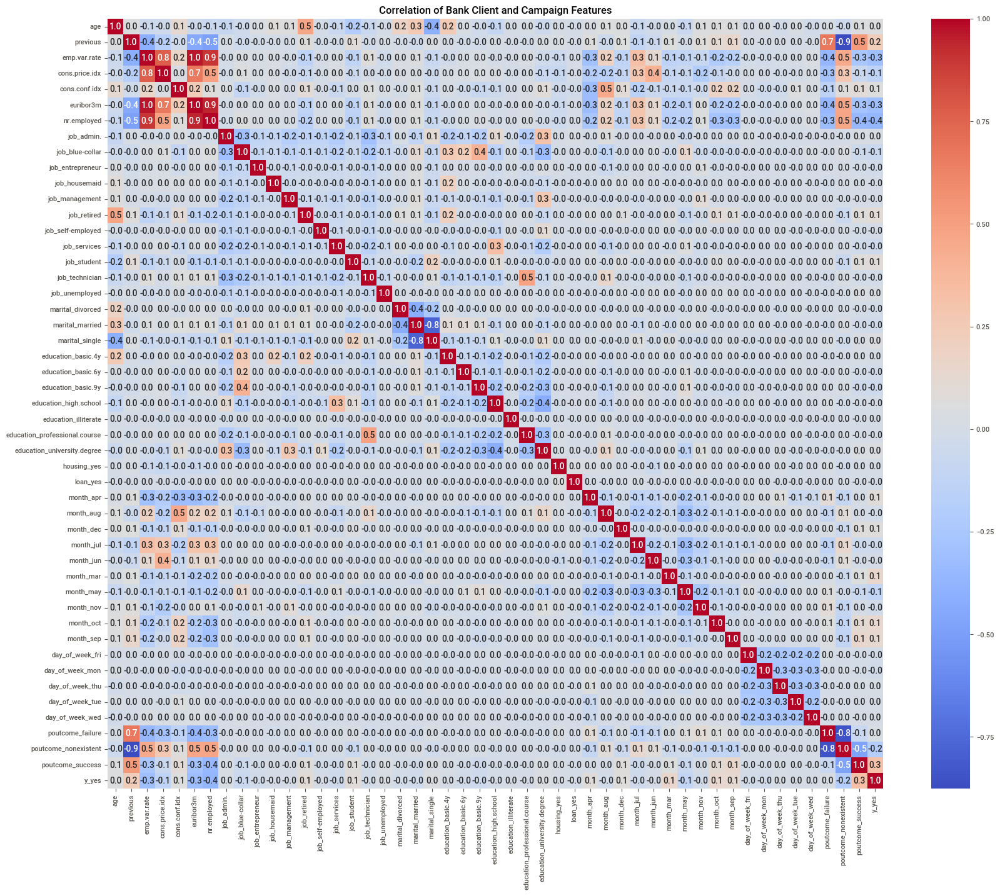

In [12]:
# Correlation heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".1f")
plt.title('Correlation of Bank Client and Campaign Features')
plt.show()

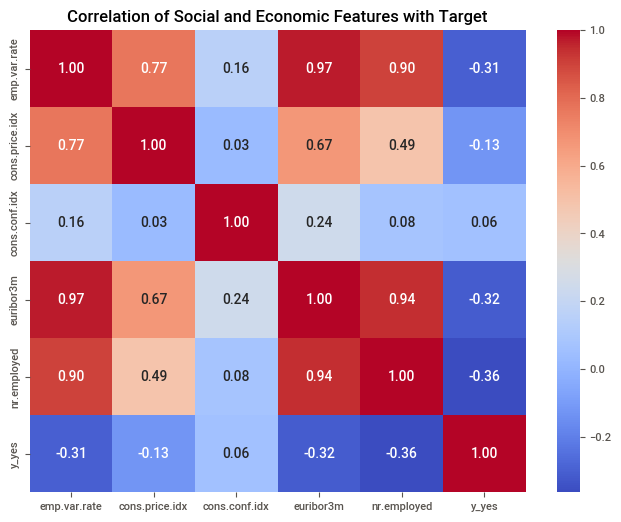

In [13]:
# Correlation heatmap of social and economic context features with target
context_features = ['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y_yes']
plt.figure(figsize=(8, 6))
sns.heatmap(df[context_features].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation of Social and Economic Features with Target')
plt.show()

### Correlation Analysis
* emp.var.rate - Employment variation has strong correlation with Number of employees (nr.employed), and weak correlation with target.  Drop column as it is not helpful for model
* euribor.3m - Labor 3m rate is also strongly correlated with number of employees, but we will keep as both features have some correlation with target
* cons.conf.idx - Consumer confidence index is weakly correlated with target.  Drop column from model
* poutcome_nonexistent - Non-existent previous outcome is already represented by previous = 0 records.  Drop column from model

In [14]:
# Drop columns not useful for model
df = df.drop(columns=['emp.var.rate', 'cons.conf.idx', 'poutcome_nonexistent'], axis=1)

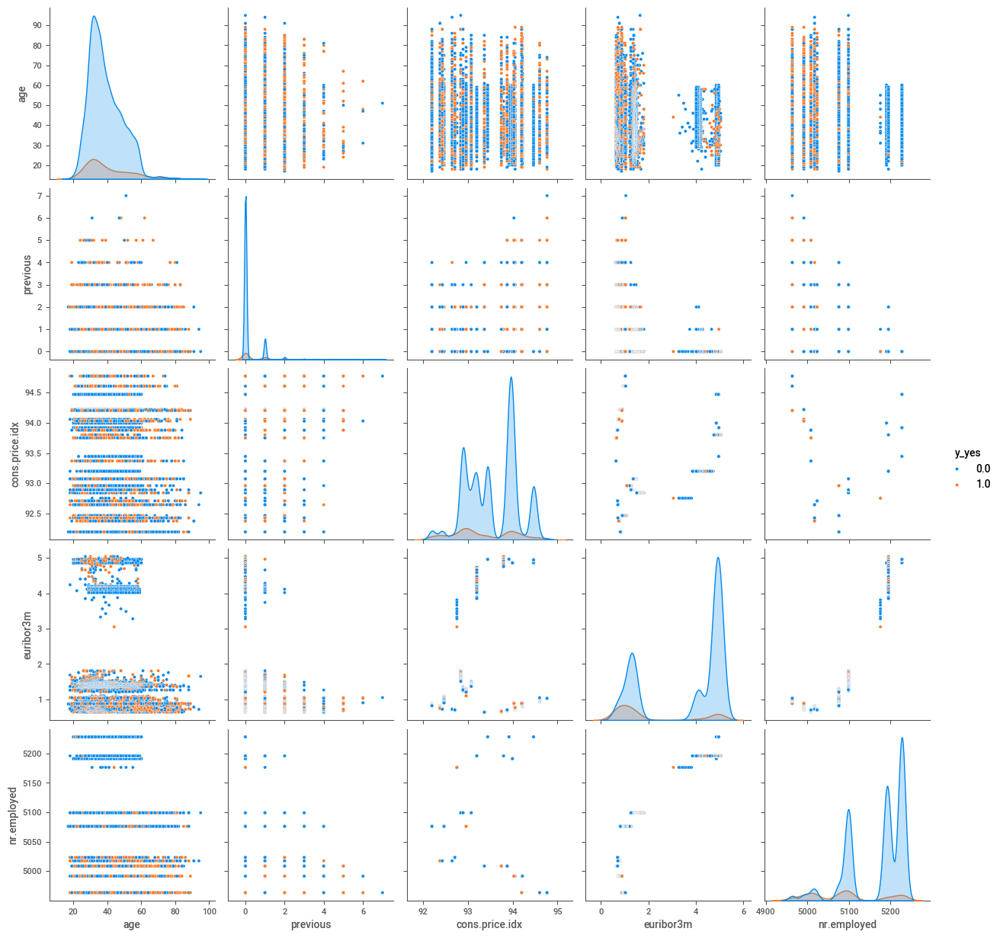

In [15]:
# Plot distribution of numeric features
numeric_features = ['age', 'previous', 'cons.price.idx', 'euribor3m', 'nr.employed']
sns.pairplot(df[numeric_features + ['y_yes']], hue='y_yes')

### Data Distribution 
* Target distribution is imbalance - 11.3% yes vs 88.7% no (from profile data)
* Distribution of age, number of previous contacts, and economic context attributes are not normally distributed
* Some clustering with number of employees and Euro Libor 3m 

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30488 entries, 0 to 30487
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            30488 non-null  int64  
 1   previous                       30488 non-null  int64  
 2   cons.price.idx                 30488 non-null  float64
 3   euribor3m                      30488 non-null  float64
 4   nr.employed                    30488 non-null  float64
 5   job_admin.                     30488 non-null  float64
 6   job_blue-collar                30488 non-null  float64
 7   job_entrepreneur               30488 non-null  float64
 8   job_housemaid                  30488 non-null  float64
 9   job_management                 30488 non-null  float64
 10  job_retired                    30488 non-null  float64
 11  job_self-employed              30488 non-null  float64
 12  job_services                   30488 non-null 

### Prepare Data for Modeling

* Scale numeric data
* Split data into a train and test set
* Select features based using permutation importance

In [17]:
# Scale numeric features
scaler = StandardScaler()

scaled_features = scaler.fit_transform(df[numeric_features])
df[numeric_features] = scaled_features

In [18]:
# Split data
y = df['y_yes']
X = df.drop(['y_yes'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [19]:
# Use LogisticRegression to perform permutation importance
model = LogisticRegression()
model.fit(X_train, y_train)
perm_importance = permutation_importance(model, X_train, y_train, n_repeats=30, random_state=0)

# Get feature importances and their indices
sorted_idx = perm_importance.importances_mean.argsort()

/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


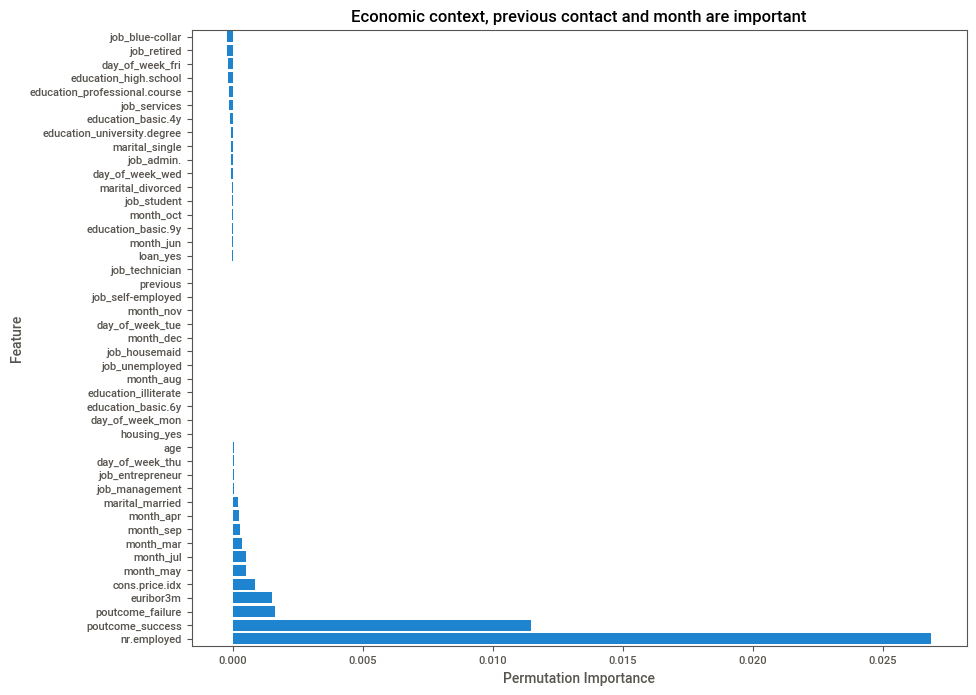

In [20]:
barPlotData = pd.DataFrame({'Feature': X_train.columns[sorted_idx], 'ImportanceValue': perm_importance.importances_mean[sorted_idx]})

plt.figure(figsize=(10, 8))

sns.barplot(y='Feature', x='ImportanceValue', data=barPlotData)
plt.ylabel('Feature')
plt.xlabel('Permutation Importance')
plt.title('Economic context, previous contact and month are important')

plt.show()

In [21]:
barPlotData

,Feature,ImportanceValue
0,job_blue-collar,-0.000245
1,job_retired,-0.000242
2,day_of_week_fri,-0.000190
3,education_high.school,-0.000185
4,education_professional.course,-0.000168
5,job_services,-0.000152
6,education_basic.4y,-0.000128
7,education_university.degree,-0.000083
8,marital_single,-0.000074
9,job_admin.,-0.000070


### Feature Importance Analysis
* Day of week, existing loan status and some job and education level have low influence over outcome
* Drop bottom 20 features for modeling


In [22]:
barPlotData['Feature'].head(20)

0                   job_blue-collar
1                       job_retired
2                   day_of_week_fri
3             education_high.school
4     education_professional.course
5                      job_services
6                education_basic.4y
7       education_university.degree
8                    marital_single
9                        job_admin.
10                  day_of_week_wed
11                 marital_divorced
12                      job_student
13                        month_oct
14               education_basic.9y
15                        month_jun
16                         loan_yes
17                   job_technician
18                         previous
19                job_self-employed
Name: Feature, dtype: object

### Model Comparison

Compare baseline model with Logistic Regression, KNN, Decision Tree and SVM models


In [23]:
# Instantiate 5 models with default settings
models = [
    { 
        'name': 'Baseline',
        'model': DummyClassifier(),
        'confusion_matrix': []
    },
    { 
        'name': 'Logistic Regression',
        'model': LogisticRegression(),
        'confusion_matrix': []
    },
    { 
        'name': 'KNN',
        'model': KNeighborsClassifier(),
        'confusion_matrix': []
    },
    { 
        'name': 'Descision Tree',
        'model': DecisionTreeClassifier(),
        'confusion_matrix': []
    },
    { 
        'name': 'SVM',
        'model': SVC(),
        'confusion_matrix': []
    }
]

df_comparison = pd.DataFrame(columns=['Model', 'Train Time', 'Train Accuracy',	'Test Accuracy'])

for i, m in enumerate(models, start=0):
    # Fit and time model
    start_time = time.time()
    m['model'].fit(X_train, y_train)
    end_time = time.time()
    test_score = m['model'].score(X_test, y_test)
    train_score = m['model'].score(X_train, y_train)
    fit_time = end_time - start_time

    # Store result in data frame
    df_comparison.loc[i] = [m['name'], fit_time, train_score, test_score]

    # Store confusion matrix 
    m['confusion_matrix'] = confusion_matrix(y_test, m['model'].predict(X_test))

/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [24]:
df_comparison

,Model,Train Time,Train Accuracy,Test Accuracy
0,Baseline,0.001505,0.874334,0.869793
1,Logistic Regression,0.182805,0.888274,0.881929
2,KNN,0.002803,0.904961,0.871105
3,Descision Tree,0.093105,0.987249,0.823221
4,SVM,12.184679,0.894834,0.883896


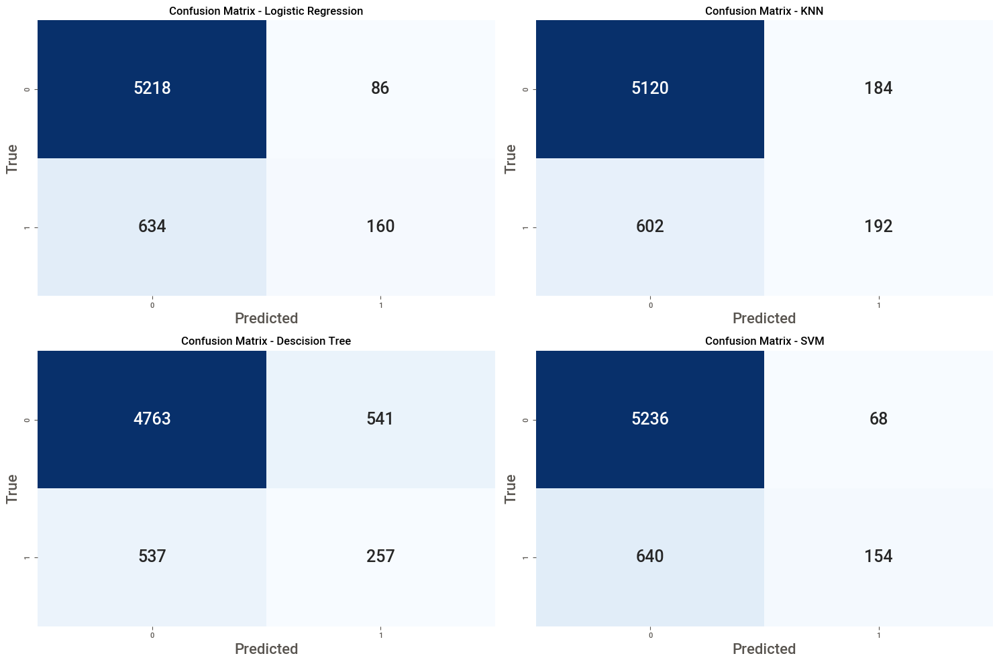

In [25]:
plt.figure(figsize=(15, 10))

# Confusion matrixes
for i, model_info in enumerate(models[1:], start=1):
    plt.subplot(2, 2, i)
    sns.heatmap(model_info['confusion_matrix'], annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 18})
    plt.title(f"Confusion Matrix - {model_info['name']}")
    plt.xlabel('Predicted', fontsize=16)
    plt.ylabel('True', fontsize=16)

plt.tight_layout()
plt.show()

### Model Evaluation

* SVM model has the best accuracy score with the fewest false negative, but it takes 60 times more training time to achieve 0.002 better accuracy score than Logistic Regression model
* KNN algorithm is the fastest, taking 1.5% of training time to Logistic Regression model, but it has the lowest accuracy score.
* With default settings, Logistic Regression model seems to be the best model balancing training time with accuracy

### Improving the Model

Now that we have some basic models on the board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.  For example, should we keep the gender feature?  Why or why not?
- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

#### Feature engineering

* Drop features based on feature importance 

In [26]:
# Drop features from train and test dataframe
X_train_imp = X_train.drop(columns=barPlotData['Feature'].head(20), axis=1)
X_test_imp = X_test.drop(columns=barPlotData['Feature'].head(20), axis=1)

In [27]:
# Rerun models with 20 fewer features
models_minus_20 = [
    { 
        'name': 'Logistic Regression -20',
        'model': LogisticRegression(),
        'confusion_matrix': []
    },
    { 
        'name': 'KNN -20',
        'model': KNeighborsClassifier(),
        'confusion_matrix': []
    },
    { 
        'name': 'Descision Tree -20',
        'model': DecisionTreeClassifier(),
        'confusion_matrix': []
    },
    { 
        'name': 'SVM -20',
        'model': SVC(),
        'confusion_matrix': []
    }
]


for i, m in enumerate(models_minus_20, start=5):
    # Fit and time model
    start_time = time.time()
    m['model'].fit(X_train_imp, y_train)
    end_time = time.time()
    test_score = m['model'].score(X_test_imp, y_test)
    train_score = m['model'].score(X_train_imp, y_train)
    fit_time = end_time - start_time

    # Store result in data frame
    df_comparison.loc[i] = [m['name'], fit_time, train_score, test_score]

    # Store confusion matrix 
    m['confusion_matrix'] = confusion_matrix(y_test, m['model'].predict(X_test_imp))

In [28]:
df_comparison

,Model,Train Time,Train Accuracy,Test Accuracy
0,Baseline,0.001505,0.874334,0.869793
1,Logistic Regression,0.182805,0.888274,0.881929
2,KNN,0.002803,0.904961,0.871105
3,Descision Tree,0.093105,0.987249,0.823221
4,SVM,12.184679,0.894834,0.883896
5,Logistic Regression -20,0.160233,0.888356,0.882912
6,KNN -20,0.005850,0.902706,0.875041
7,Descision Tree -20,0.053207,0.963961,0.844539
8,SVM -20,6.896186,0.891062,0.882092


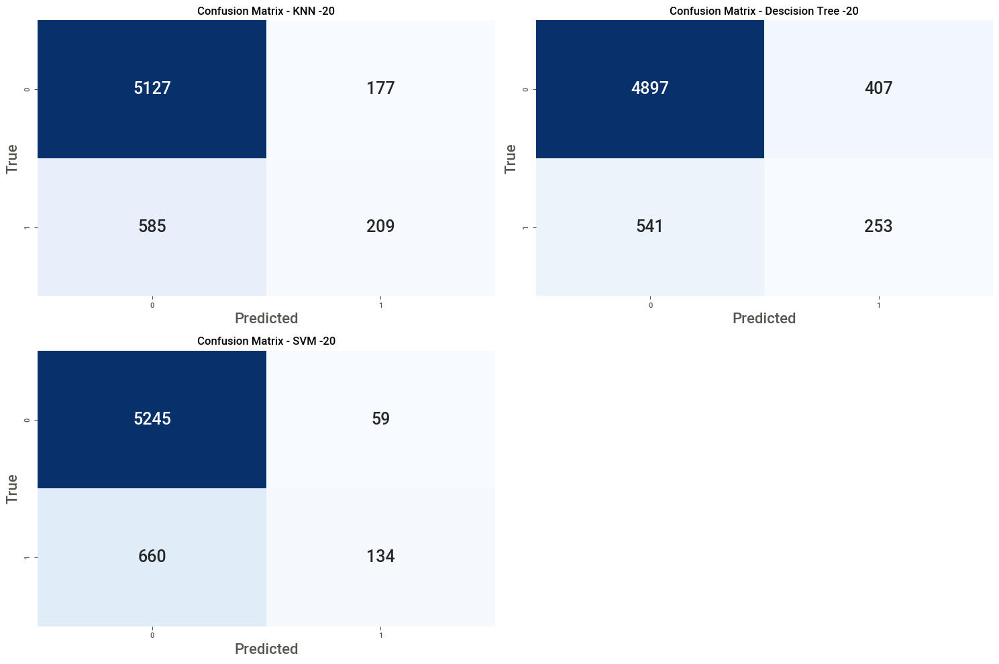

In [29]:
plt.figure(figsize=(15, 10))

# Confusion matrixes
for i, model_info in enumerate(models_minus_20[1:], start=1):
    plt.subplot(2, 2, i)
    sns.heatmap(model_info['confusion_matrix'], annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 18})
    plt.title(f"Confusion Matrix - {model_info['name']}")
    plt.xlabel('Predicted', fontsize=16)
    plt.ylabel('True', fontsize=16)

plt.tight_layout()
plt.show()

In [30]:
#### Hyperparameter tuning and grid search

In [31]:
# Rerun models with 20 fewer features
models_GS = [
    { 
        'name': 'Logistic Regression GridSearch',
        'model': LogisticRegression(),
        'param_grid': {
            'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
            'penalty': ['l1', 'l2'],              # Regularization type
            'solver': ['liblinear', 'lbfgs']              # Algorithm to use in the optimization problem
        },
        'best_params': {}
    },
    { 
        'name': 'KNN GridSearch',
        'model': KNeighborsClassifier(),
        'param_grid': {
            'n_neighbors': [3, 5, 7, 9, 11],     # Number of neighbors to consider
            'weights': ['uniform', 'distance']  # Weight function used in prediction
        },
        'best_params': {}
    },
    { 
        'name': 'Descision Tree GridSearch',
        'model': DecisionTreeClassifier(),
        'param_grid': {
            'max_depth': [None, 10, 20, 30, 40, 50],           # Maximum depth of the tree
            'min_samples_split': [2, 5, 10],                    # Minimum number of samples required to split an internal node
            'min_samples_leaf': [1, 2, 4],                      # Minimum number of samples required to be at a leaf node
            'criterion': ['gini', 'entropy']                   # Function to measure the quality of a split
        },
        'best_params': {}
    },
    { 
        'name': 'SVM GridSearch',
        'model': SVC(),
        'param_grid': {
            'C': [0.1, 1, 10],                 # Regularization parameter
            'kernel': ['linear', 'rbf', 'poly'],    # Kernel type
            'gamma': ['scale', 'auto']              # Kernel coefficient
        },
        'best_params': {}
    }
]


for i, m in enumerate(models_GS):
    # Fit GridSearchCV
    grid_search = GridSearchCV(m['model'], m['param_grid'], cv=5, verbose=1, n_jobs=-1)
    grid_search.fit(X_train_imp, y_train)
    m['best_params'] = grid_search.best_params_
    best_model = grid_search.best_estimator_ 
    y_pred = best_model.predict(X_test_imp)
    print("Model:", m['name'])
    print("Accuracy Score:", accuracy_score(y_test, y_pred))    
    print("Best parameters:", grid_search.best_params_)
    print("")


Fitting 5 folds for each of 24 candidates, totalling 120 fits


/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error

Model: Logistic Regression GridSearch
Accuracy Score: 0.882748442112168
Best parameters: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Model: KNN GridSearch
Accuracy Score: 0.8761889143981634
Best parameters: {'n_neighbors': 11, 'weights': 'uniform'}

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Model: Descision Tree GridSearch
Accuracy Score: 0.8788127254837652
Best parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 5}

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Model: SVM GridSearch
Accuracy Score: 0.8820924893407674
Best parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}



In [32]:
# models_tuned = [
#     { 
#         'name': 'Logistic Regression Tuned',
#         'model': LogisticRegression(C=0.1, penalty='l1', solver='liblinear'),
#         'confusion_matrix': []
#     },
#     { 
#         'name': 'KNN Tuned',
#         'model': KNeighborsClassifier(n_neighbors=11, weights='uniform'),
#         'confusion_matrix': []
#     },
#     { 
#         'name': 'Descision Tree Tuned',
#         'model': DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4, min_samples_split=5),
#         'confusion_matrix': []
#     },
#     { 
#         'name': 'SVM Tuned',
#         'model': SVC(C= 1, gamma='scale', kernel='rbf'),
#         'confusion_matrix': []
#     }
# ]

models_tuned = [
    { 
        'name': 'Logistic Regression Tuned',
        'model': LogisticRegression(**models_GS[0]['best_params']),
        'confusion_matrix': []
    },
    { 
        'name': 'KNN Tuned',
        'model': KNeighborsClassifier(**models_GS[1]['best_params']),
        'confusion_matrix': []
    },
    { 
        'name': 'Descision Tree Tuned',
        'model': DecisionTreeClassifier(**models_GS[2]['best_params']),
        'confusion_matrix': []
    },
    { 
        'name': 'SVM Tuned',
        'model': SVC(**models_GS[3]['best_params']),
        'confusion_matrix': []
    }
]

for i, m in enumerate(models_tuned, start=9):
    # Fit and time model
    start_time = time.time()
    m['model'].fit(X_train, y_train)
    end_time = time.time()
    test_score = m['model'].score(X_test, y_test)
    train_score = m['model'].score(X_train, y_train)
    fit_time = end_time - start_time

    # Store result in data frame
    df_comparison.loc[i] = [m['name'], fit_time, train_score, test_score]

    # Store confusion matrix 
    m['confusion_matrix'] = confusion_matrix(y_test, m['model'].predict(X_test))

In [33]:
df_comparison

,Model,Train Time,Train Accuracy,Test Accuracy
0,Baseline,0.001505,0.874334,0.869793
1,Logistic Regression,0.182805,0.888274,0.881929
2,KNN,0.002803,0.904961,0.871105
3,Descision Tree,0.093105,0.987249,0.823221
4,SVM,12.184679,0.894834,0.883896
5,Logistic Regression -20,0.160233,0.888356,0.882912
6,KNN -20,0.005850,0.902706,0.875041
7,Descision Tree -20,0.053207,0.963961,0.844539
8,SVM -20,6.896186,0.891062,0.882092
9,Logistic Regression Tuned,0.149612,0.888602,0.882748


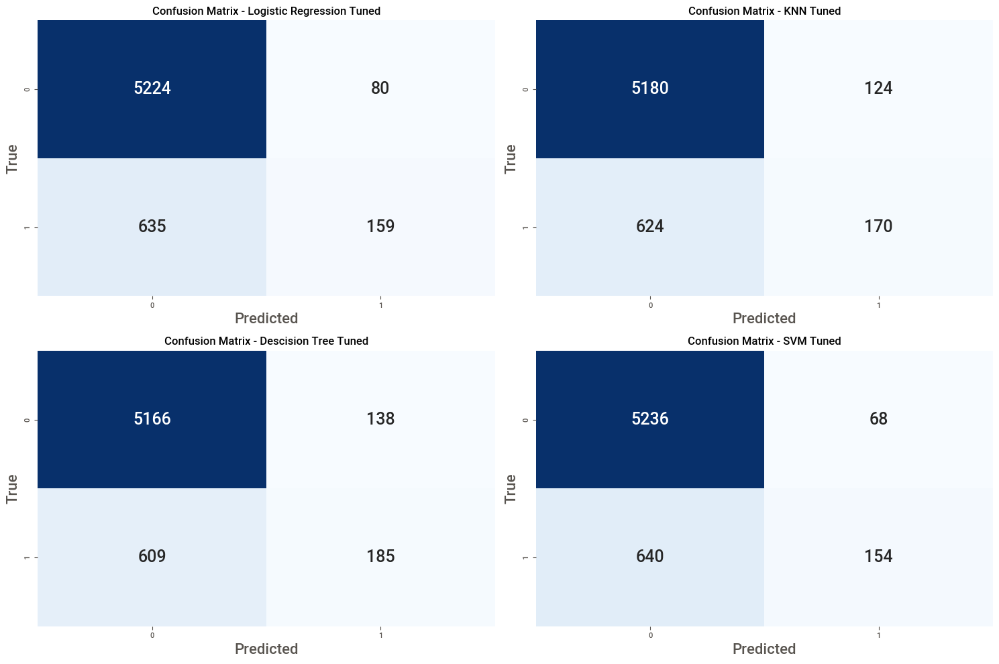

In [34]:
plt.figure(figsize=(15, 10))

# Confusion matrixes
for i, model_info in enumerate(models_tuned, start=1):
    plt.subplot(2, 2, i)
    sns.heatmap(model_info['confusion_matrix'], annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 18})
    plt.title(f"Confusion Matrix - {model_info['name']}")
    plt.xlabel('Predicted', fontsize=16)
    plt.ylabel('True', fontsize=16)

plt.tight_layout()
plt.show()

# Conclusion
## Observations
* Positive economic conditions increase the likelihood of long-term deposit subscription
  * Low unemployment rate - High number of employees
  * High interest rate - High Euribor 3 month rate
  * Consumer confidence - High Consumer Confidence Index
* Contacts who have subscribed before are more likely to subscribe again
* While month of contact shows strong influence to predict positive result, it is correlated to high interest rate

## Model Selection
*Use Decision Tree model*
* While Decision Tree model has lower accuracy than Logistic Regression and SVM, it has the highest correct prediction.  Using this model, the bank can spend more resources on contacts that are likely to subscribe.  This model has the best balance of accuracy and computing resource.
* The impact of false positive is the cost of additional contacts.  If the bank is willing to spend more resources to get more subscriptions, we should use this model.  If resources are limited and the bank can only contact limited number of potential customers, we should use the Logistic Regression model.
* SVM model has the highest accuracy and lowest false positive, however, it takes a long time to process.  We would recommend this model if computing resources is not a concern.

## Recommendations
* Staff up and launch large campaign when unemployment rate decrease and interest rate increases are expected
* Use Decision Tree model predict and prioritize contacts who are likely to subscribe

## Next steps
* Improve model with more data points, like time of contact, savings account balance
* Experiment with evening and weekend contact
* Since low interest rate could dampen business results, create model with data during low interest rate period to see what factors can drive stronger subscriptions rates


# 